# CMEMS: A use case [BETA]

__Disclaimer:__ This notebook is at an early stage of development and might not be fully working 

Some cells are labelled with __User action__: it means that you can/have to perform an action (eg, choosing some parameters) 

### Example of visualization of Copernicus Marine Service and Sentinel (1 & 2) products 

...over the Baltic Sea, on 2019-06-04

In [1]:
import os
from IPython.core.display import display, HTML

import cmemslib

### CMEMS account authentication

##### Registration

In [2]:
url_cmems = 'http://marine.copernicus.eu/services-portfolio/register-now/'
display(HTML(f"""<a href={url_cmems}>{'Please click here to registrate with CMEMS'}</a>"""))

##### Credentials

Please enter your credentials here below:

In [3]:
cmems_username = '<your CMEMS username goes here>'
cmems_password = '<your CMEMS password goes here>'

host = 'nrt.cmems-du.eu'

## 1 - MODEL product

Exemple of product: `BALTICSEA_ANALYSIS_FORECAST_PHY_003_006`

### 1.1 - Download the desired product 

Click on the "Download The File" button to run the example

In [4]:
update = cmemslib.Cmems.download_Product(cmems_username, cmems_password, 'Model') 

,MODEL PRODUCTS


interactive(children=(Dropdown(description='Product:', index=4, layout=Layout(width='initial'), options=('ARCT…

### 1.2 - Read the downloaded product

In [5]:
ds, selected_list, selected_list_name, file_name = cmemslib.Cmems.read_File(update, 'Model')
dictionary = dict(zip(selected_list_name, selected_list))

### 1.3 - Display the selected parameter (Work In Progress) 

Please click on the "Display the Param" button to run the example

In [6]:
update_disp = cmemslib.Cmems.display_param_model(ds, selected_list, selected_list_name)

interactive(children=(Dropdown(description='Parameters:', index=4, layout=Layout(width='initial'), options=('s…

## 2 - SATELLITE product 

Exemple of product: `SST_EUR_SST_L3S_NRT_OBSERVATIONS_010_009_a`

### 2.1 - Download the desired product

Click on the "Download The File" button to run the example

In [7]:
update2 = cmemslib.Cmems.download_Product(cmems_username, cmems_password, 'Satellite')

,SATELLITE OBSERVATION PRODUCTS


interactive(children=(Dropdown(description='Product:', index=52, layout=Layout(width='initial'), options=('MUL…

### 2.2 - Read the downloaded product

In [8]:
ds2, selected_list2, selected_list_name2, file_name2 = cmemslib.Cmems.read_File(update2, 'Satellite')

### 2.3 - Display the selected parameter (Work In Progress)

#### User action 

Choose a colormap scale for the figures between these two options "Same_as_Model_Product" and "Default" 

In [9]:
scale_min, scale_max = update_disp()

colormap_scale = 'Same_as_Model_Product'
#colormap_scale='Default'

cmemslib.Cmems.display_param_satellite(ds2, selected_list2, file_name2, scale_min, scale_max, colormap_scale)

interactive(children=(Dropdown(description='Parameters:', index=5, layout=Layout(width='initial'), options=('s…

## 3 - INSITU product 

Exemple of product: `INSITU_BAL_NRT_OBSERVATIONS_013_032`

### 3.1 - Download the desired product

Please click on the "Download" button to run the example

In [10]:
import ftputil.error as ftperr

try:
    update3 = cmemslib.Cmems.Insitu_Products_download(host, cmems_username, cmems_password)
except ftperr.FTPIOError as e:
    print(f'An error occured during download:\n{e}')

An error occured during download:
550 Failed to open file.
Debugging info: ftputil 3.4, Python 3.7.6 (linux)


### 3.2 - Display all downloaded files

In [11]:
if os.getcwd() == '/home/jovyan/public':
    output_directory = '/home/jovyan/work/cmems_data/03_Insitu_product'
else:
    output_directory = f'{os.getcwd()}/cmems_data/03_Insitu_product'
    
# open file and read the content in a list
dataset_all = []
downloaded_files = f'{output_directory}/Datasets_downloaded.txt'
try:
    with open(downloaded_files, 'r') as filehandle:  
        for line in filehandle:
            # remove linebreak which is the last character of the string
            currentPlace = line[:-1]
            # add item to the list
            dataset_all.append(currentPlace)
    dataset_all
except FileNotFoundError:
    print(f'{downloaded_files} does not exist, an error probably occured in the previous cell')

/home/jovyan/work/cmems_data/03_Insitu_product/Datasets_downloaded.txt does not exist, an error probably occured in the previous cell


### 3.3 - Read all downloaded files

In [12]:
all_ds = cmemslib.Cmems.Insitu_read_files(dataset_all)

### 3.4 - Display the parameter (Work In Progress) 

#### User action

Choose a colormap scale for the figures between these two options "Same_as_Model_Product" and "Default"

In [13]:
try:
    selected_product, selected_parameter = update3()
except NameError as e:
    print(f'An error probably occured in previous cells:\n{e}')
else:
    colormap_scale = 'Same_as_Model_Product'
    #colormap_scale = 'Default'

    cmemslib.Cmems.display_Insitu_product(all_ds, selected_product, selected_parameter, scale_min, scale_max, colormap_scale)

An error probably occured in previous cells:
name 'update3' is not defined


## 4 - SENTINEL (1 & 2)  images

### 4.1 - Parameters

In [14]:
from owslib.wms import WebMapService
import datetime
from sentinelhub import BBox, CRS, DataSource, MimeType, SHConfig, WmsRequest, WcsRequest
from PIL import Image

INSTANCE_ID_GRD = '88b68ca0-1f84-4286-8359-d3f480771de5'
INSTANCE_ID_L1C = 'd275ef59-3f26-4466-9a60-ff837e572144'
config = SHConfig()

# Select a date 
year = '2019'
month = '06'
day = '04' 

wms = WebMapService('https://tiles.maps.eox.at/wms?service=wms', version='1.1.1') # WMS of EOX
layers = list(wms.contents)
projection = 'EPSG:4326' 

# The Bounding box of the Baltic Sea
bbox = 7.041666030883789, 50.024993896484375, 32.3194465637207, 70.09166259765625
bbox_large = BBox(bbox=list(bbox), crs=CRS.WGS84)

# Size of the WMS images
height = 2294 
width = 2890 

### 4.2 - Get the Sentinel 2 cloudless image for 2018 by EOX

In [15]:
wms_eox = wms.getmap(layers=[wms[layers[19]].name],
                     srs=projection,
                     bbox=bbox,
                     size=(width, height),
                     format='image/png',
                     showlogo=False,
                     transparent=False)

### 4.3 - Get the Sentinel 2 image for the selected date

#### Note

The run time may take about 1-2 minutes

In [16]:
config.instance_id = INSTANCE_ID_L1C

wms_true_color_request_with_deltat = WmsRequest(layer='1_NATURAL_COL0R',
                                                bbox=bbox_large,
                                                time=f'{year}-{month}-{day}',
                                                width=width,
                                                height=height,
                                                image_format=MimeType.PNG,
                                                config=config,
                                                time_difference=datetime.timedelta(days=50))
wms_true_color_img = wms_true_color_request_with_deltat.get_data()

### 4.4 - Get the Sentinel 1 image for the selected date

#### Note

The run time may take about 6-7 minutes

In [17]:
config.instance_id = INSTANCE_ID_GRD

wms_radar_request_with_deltat = WmsRequest(layer='IW_VV',
                                           bbox=bbox_large,
                                           time=f'{year}-{month}-{day}',
                                           width=width,
                                           height=height,
                                           image_format=MimeType.PNG,
                                           config=config,
                                           data_source=DataSource.SENTINEL1_IW,
                                           time_difference=datetime.timedelta(days=50))
wms_radar_img = wms_radar_request_with_deltat.get_data()
sentinel1_image = wms_radar_img[0]

### 4.5 - Visualisation of the downlaoded images over Baltic Sea

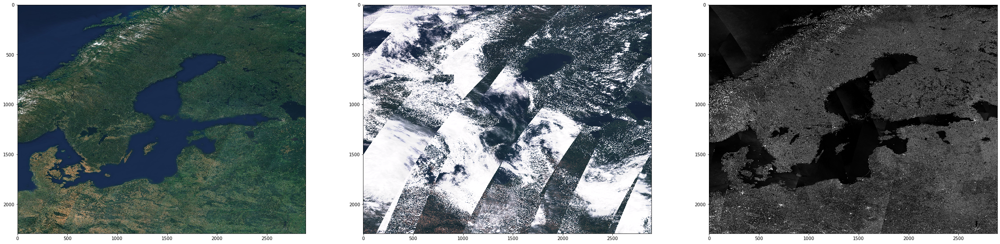

In [18]:
from matplotlib import pyplot as plt

plt.figure(figsize=(40, 50))
plt.subplot(131)
plt.imshow(Image.open(wms_eox))
plt.subplot(132)
plt.imshow(wms_true_color_img[0])
plt.subplot(133)
plt.imshow(sentinel1_image, cmap='gray')
plt.show()

## 5 - Display all results

#### Note

The run time may take about 1-2 minutes

#### User action

Choose a colormap scale for the figures between these two options "Same_as_Model_Product" and "Default"

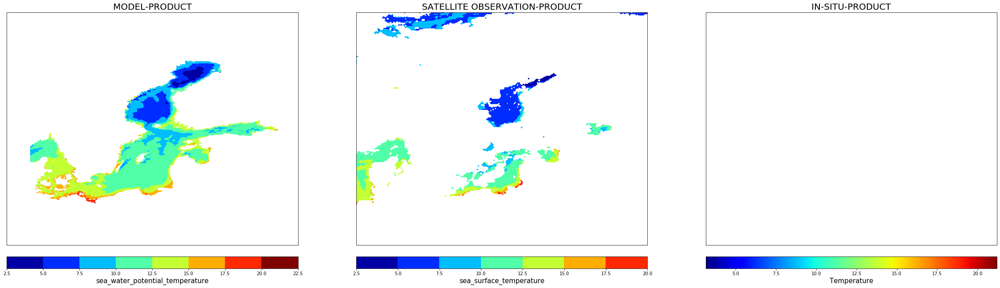

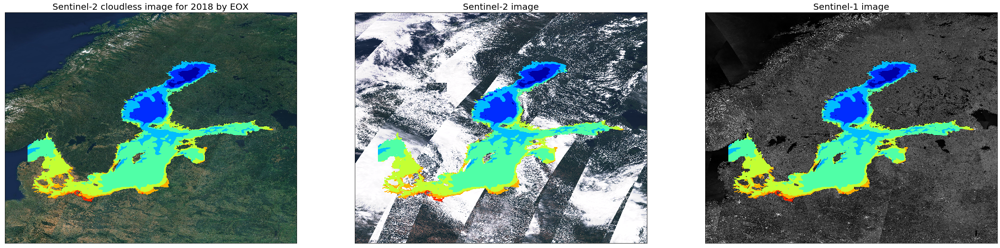

<Figure size 1584x2160 with 0 Axes>

<Figure size 1296x1728 with 0 Axes>

<Figure size 1296x1728 with 0 Axes>

In [19]:
colormap_scale = 'Same_as_Model_Product'
#colormap_scale = 'Default'

# Set the Model Product Parameters:
param_model_product = dictionary['sea_water_potential_temperature']

# Set the Satelitte Product Parameters:
param_satellite_product = 'sea_surface_temperature'

# Set the Insitu Product Parameters:
param_insitu = 'TEMP'

# Sentinel 1 image
img_sentinel2 = wms_true_color_img[0]

cmemslib.Cmems.Display_all_figures(ds, param_model_product, ds2, param_satellite_product, file_name2, all_ds, param_insitu, wms_eox, img_sentinel2, sentinel1_image, scale_min, scale_max, colormap_scale)

## 6 - Display all the results on an interactive map

### 6.1 - Parameters

In [20]:
import ipywidgets as widgets
from mundilib import MundiCatalogue

c = MundiCatalogue()
wms_sentinel2 = c.get_collection('Sentinel2').mundi_wms('L1C')
wms_sentinel1 = c.get_collection('Sentinel1').mundi_wms('GRD')

style = {'description_width': 'initial'}
layers = list(wms_sentinel2.contents)
sentinel2_layer = widgets.Dropdown(
    layout={'width': 'initial'},
    options=layers,
    value=layers[1],
    description='Sentinel 2 layer:',
    disabled=False,
    style=style,
)
layers2 = list(wms_sentinel1.contents)
sentinel1_layer = widgets.Dropdown(
    layout={'width': 'initial'},
    options=layers2,
    value=layers2[0],
    description='Sentinel 1 layer:',
    disabled=False,
    style=style,
)

display(sentinel2_layer)
display(sentinel1_layer)

Dropdown(description='Sentinel 2 layer:', index=1, layout=Layout(width='initial'), options=('09_NDVI', '1_NATU…

Dropdown(description='Sentinel 1 layer:', layout=Layout(width='initial'), options=('IW_VV', 'IW-SV-LINEAR-GAMM…

### 6.2 - Creation of the interactive map

#### Note

The run time may take about 1-2 minutes

#### User action

Choose a colormap scale for the figures between these two options "Same_as_Model_Product" and "Default"

In [21]:
colormap_scale = 'Same_as_Model_Product'
#colormap_scale = 'Default'

param_model_product = dictionary['sea_water_potential_temperature']
param_satellite_product = 'sea_surface_temperature'
param_insitu = 'TEMP'
img_sentinel2 = wms_true_color_img[0]
img_radar = sentinel1_image

m = cmemslib.Cmems.Display_all_figures_folium(wms_sentinel2.url, sentinel2_layer.value, wms_sentinel1.url, sentinel1_layer.value, ds, 
                                              param_model_product, ds2, param_satellite_product, file_name2, img_sentinel2, img_radar, 
                                              scale_min, scale_max, colormap_scale, all_ds, param_insitu)

Creating the file "folium_map.html" in /home/jovyan/work/cmems_data
Done


### 6.3 - Display the interactive map

You can choose a base map by clicking the layer button in the upper-right corner.

In [22]:
m